In [1]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt 
import seaborn as sns
import os
import scanpy as sc
import logging
import argparse
from datetime import datetime 
import json
import anndata as ad
from scipy.sparse import csr_matrix
import scanpy.external as sce
from sklearn.metrics.pairwise import cosine_similarity

# Description 

In this notebook,  we will perform 

1. basic QC
2. cross species integration
3. clustering and cell type annotation 

## Basic QC

### qc criterion 1 

- filter cell with less 200 genes expressed 
- filter gene with less 100 cells expresses 
- save the adata 

(454300, 10153)  --> (441457,9915)

In [ ]:
adata = sc.read_h5ad('../anno_data/all_data.h5ad')
adata.obs.index = adata.obs.samples.values.astype(object) + '-' + adata.obs.index.values
sc.pp.filter_cells(adata, min_genes = 200)
sc.pp.filter_genes(adata, min_cells = 100)

adata.write_h5ad('ori_data_1.h5ad')

### qc criterion 2 

- filter out cells with less the 500 genes expressed
- filter out cells with more the 50000 UMI counts

(441457,9915) --> (339043，9915)

In [2]:
scdata = sc.read('ori_data_1.h5ad')
scdata

AnnData object with n_obs × n_vars = 441457 × 9915
    obs: 'species', 'tissues', 'samples', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts'

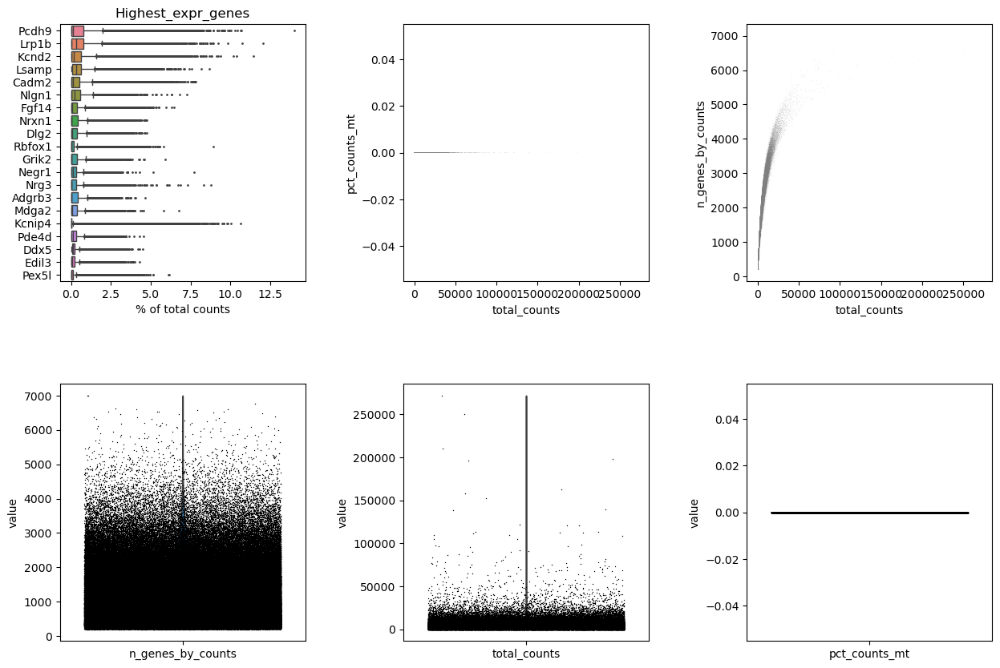

In [3]:
fig = plt.figure(figsize=(15, 10))
grid = plt.GridSpec(2, 3, hspace=0.4, wspace=0.4)

ax_1 = fig.add_subplot(grid[0,0])
sc.pl.highest_expr_genes(scdata, ax = ax_1, n_top=20,show = False)
ax_1.set_title('Highest_expr_genes')

ax_2 = fig.add_subplot(grid[0,1])
sc.pl.scatter(scdata,x='total_counts', y='pct_counts_mt',ax = ax_2,show=False)  # check 线粒体基因情况  无线粒体基因

ax_3 = fig.add_subplot(grid[0,2])
ax_3 = sc.pl.scatter(scdata, x='total_counts', y='n_genes_by_counts',ax = ax_3, show=False)  


ax_4 = fig.add_subplot(grid[1,0])
sc.pl.violin(scdata, keys = 'n_genes_by_counts',
            jitter=0.4, multi_panel=False,ax=ax_4,show=False)

ax_5 = fig.add_subplot(grid[1,1])
sc.pl.violin(scdata, keys = 'total_counts',
            jitter=0.4, multi_panel=False,ax=ax_5,show=False)

ax_6 = fig.add_subplot(grid[1,2])
sc.pl.violin(scdata, keys = 'pct_counts_mt',
            jitter=0.4, multi_panel=False,ax=ax_6,show=False)
plt.show()

(339043, 9915)


/home/sunrui/anaconda3/envs/sc_gbdt/lib/python3.9/site-packages/scanpy/preprocessing/_normalization.py:206: UserWarning: Received a view of an AnnData. Making a copy.
  view_to_actual(adata)


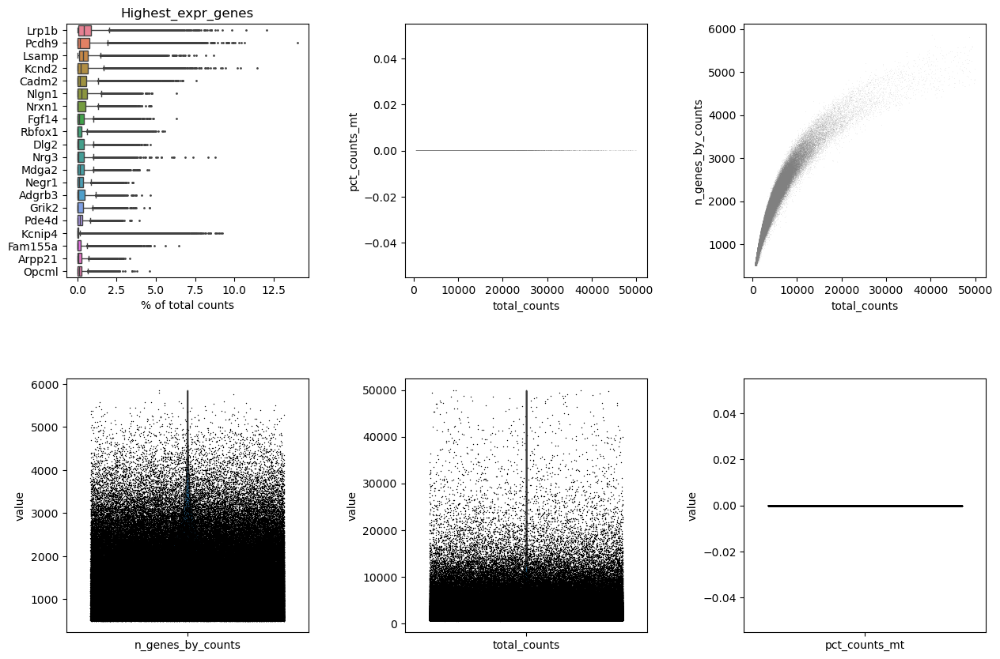

In [10]:
scdata = scdata[scdata.obs.n_genes_by_counts >= 500,:]
scdata = scdata[scdata.obs.total_counts <= 50000,:]
print(scdata.shape)

fig = plt.figure(figsize=(15, 10))
grid = plt.GridSpec(2, 3, hspace=0.4, wspace=0.4)

ax_1 = fig.add_subplot(grid[0,0])
sc.pl.highest_expr_genes(scdata, ax = ax_1, n_top=20,show = False)
ax_1.set_title('Highest_expr_genes')

ax_2 = fig.add_subplot(grid[0,1])
sc.pl.scatter(scdata,x='total_counts', y='pct_counts_mt',ax = ax_2,show=False)  # check 线粒体基因情况  无线粒体基因

ax_3 = fig.add_subplot(grid[0,2])
ax_3 = sc.pl.scatter(scdata, x='total_counts', y='n_genes_by_counts',ax = ax_3, show=False)  


ax_4 = fig.add_subplot(grid[1,0])
sc.pl.violin(scdata, keys = 'n_genes_by_counts',
            jitter=0.4, multi_panel=False,ax=ax_4,show=False)

ax_5 = fig.add_subplot(grid[1,1])
sc.pl.violin(scdata, keys = 'total_counts',
            jitter=0.4, multi_panel=False,ax=ax_5,show=False)

ax_6 = fig.add_subplot(grid[1,2])
sc.pl.violin(scdata, keys = 'pct_counts_mt',
            jitter=0.4, multi_panel=False,ax=ax_6,show=False)
plt.show()

## Normalization 

- normalization, total counts per cell is 1e5 
- log1p transformation

In [11]:
sc.pp.normalize_total(scdata, target_sum=1e5)
scdata.raw = scdata
sc.pp.log1p(scdata)

## hvg selection 

top 3k genes as hvg

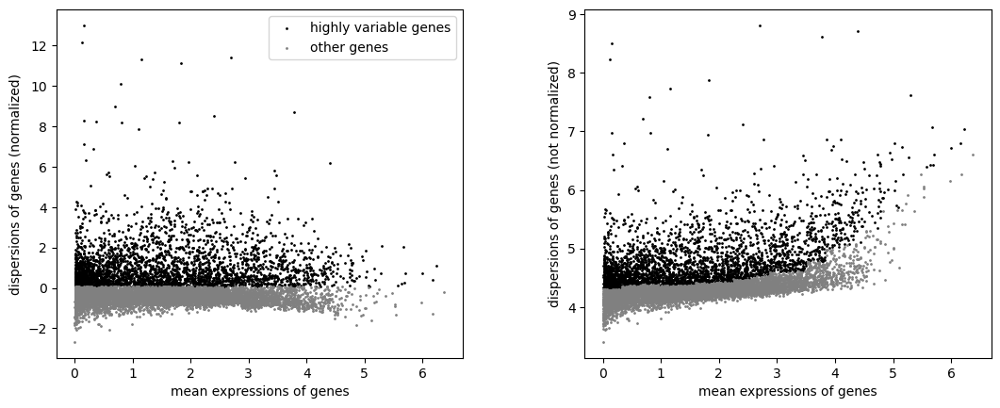

In [15]:
sc.pp.highly_variable_genes(scdata, n_top_genes = 3000,n_bins=20)
sc.pl.highly_variable_genes(scdata)

In [16]:
scdata = scdata[:,scdata.var['highly_variable'].values]
scdata.shape

(339043, 3000)

## PCA and UMAP visualization

In [17]:
sc.tl.pca(scdata)
print(f"top 10 pcs explained variance_ratio : {scdata.uns['pca']['variance_ratio'][:10].sum()}")
print(f"top 30 pcs explained variance_ratio : {scdata.uns['pca']['variance_ratio'][:30].sum()}")
print(f"top 50 pcs explained variance_ratio : {scdata.uns['pca']['variance_ratio'][:50].sum()}")

/home/sunrui/anaconda3/envs/sc_gbdt/lib/python3.9/site-packages/scanpy/preprocessing/_pca.py:314: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm["X_pca"] = X_pca


top 10 pcs explained variance_ratio : 0.26350194716760306
top 30 pcs explained variance_ratio : 0.3311514148333934
top 50 pcs explained variance_ratio : 0.3601687797551904


In [18]:
sc.pp.neighbors(scdata, n_pcs = 30)

/home/sunrui/anaconda3/envs/sc_gbdt/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


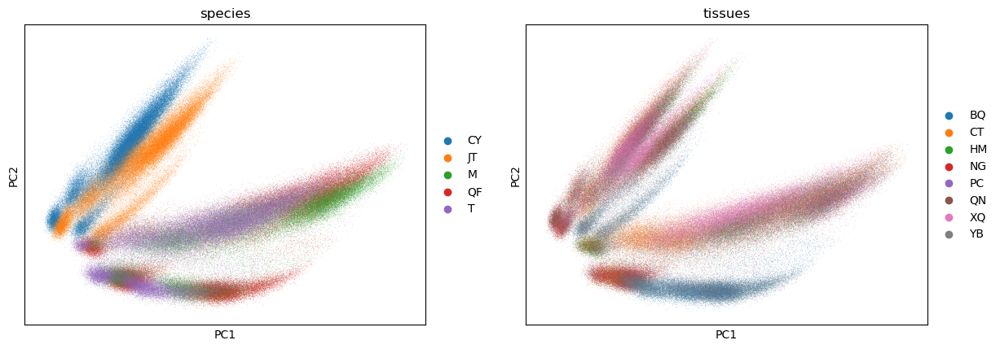

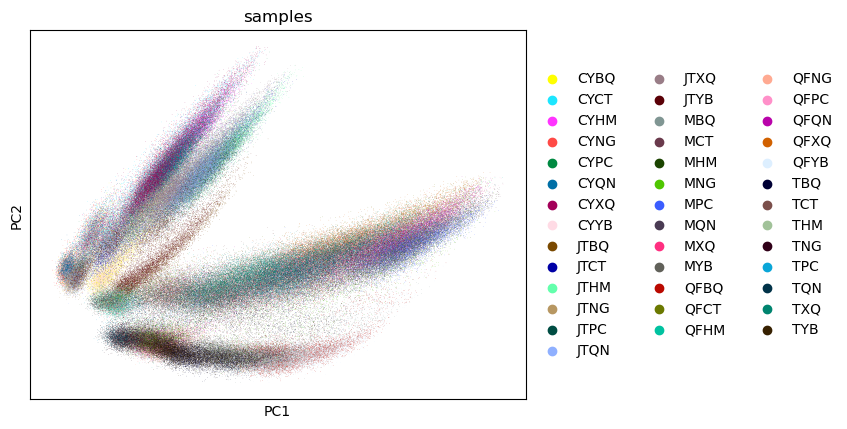

In [21]:
sc.pl.pca(scdata, color = ['species','tissues'])
sc.pl.pca(scdata, color = 'samples')

In [23]:
sc.tl.umap(scdata)
sc.tl.leiden(scdata,resolution = 0.3)

/tmp/ipykernel_3136410/3403205641.py:2: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(scdata,resolution = 0.3)


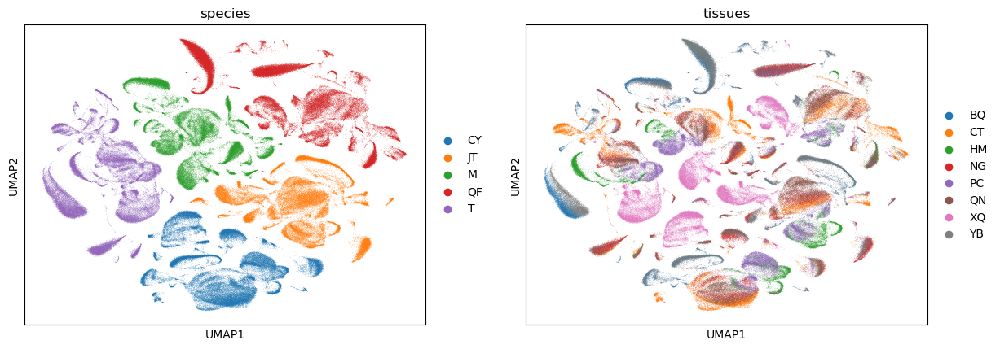

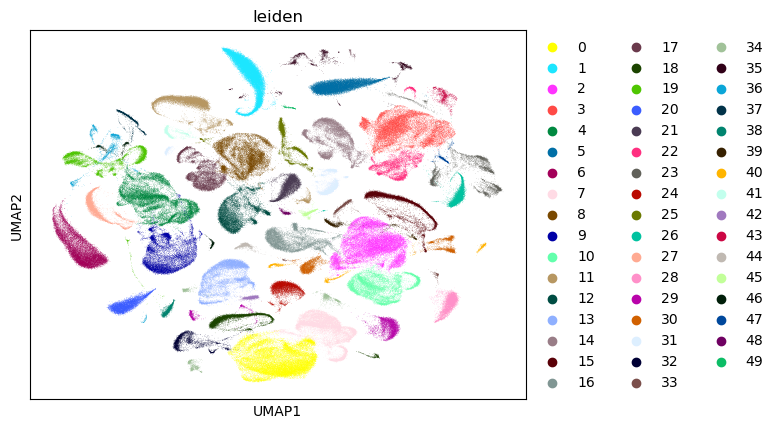

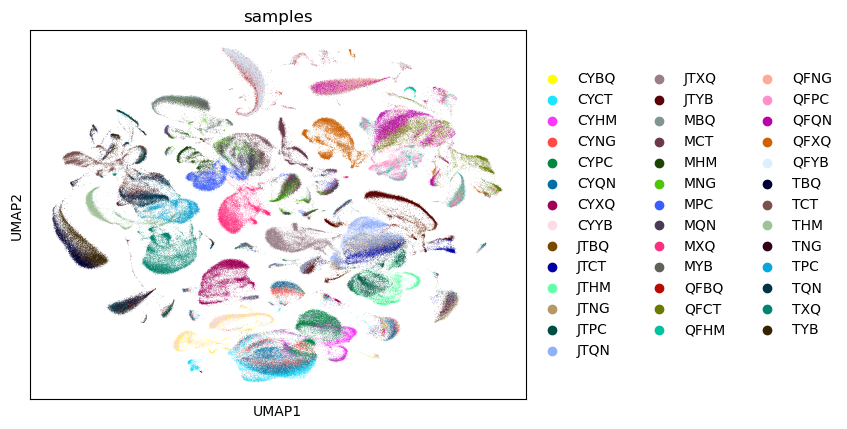

In [24]:
sc.pl.umap(scdata, color = ['species','tissues'])
sc.pl.umap(scdata, color = 'leiden')
sc.pl.umap(scdata, color = 'samples')

## harmony integration

In [25]:
sce.pp.harmony_integrate(scdata, key = 'species', basis = 'X_pca', max_iter_harmony = 20,
                        plot_convergence = True)

2024-06-18 13:18:59,469 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2024-06-18 13:19:41,007 - harmonypy - INFO - sklearn.KMeans initialization complete.
2024-06-18 13:19:44,885 - harmonypy - INFO - Iteration 1 of 20
2024-06-18 13:22:43,278 - harmonypy - INFO - Iteration 2 of 20
2024-06-18 13:25:14,783 - harmonypy - INFO - Iteration 3 of 20
2024-06-18 13:27:45,210 - harmonypy - INFO - Iteration 4 of 20
2024-06-18 13:30:15,649 - harmonypy - INFO - Iteration 5 of 20
2024-06-18 13:32:45,373 - harmonypy - INFO - Iteration 6 of 20
2024-06-18 13:34:16,325 - harmonypy - INFO - Iteration 7 of 20
2024-06-18 13:36:43,588 - harmonypy - INFO - Converged after 7 iterations


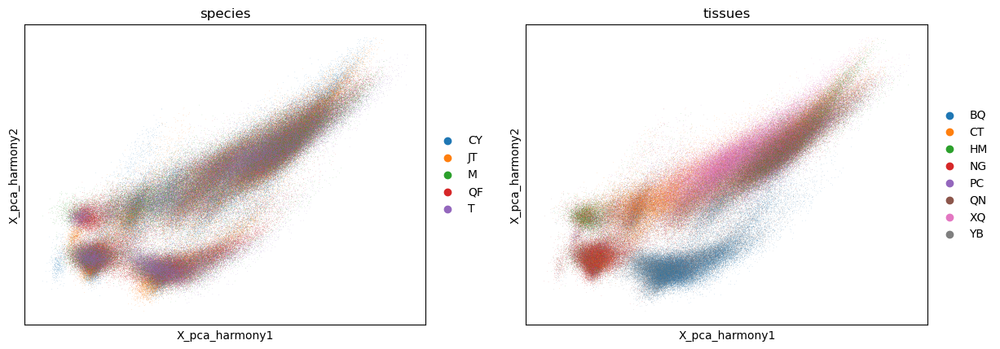

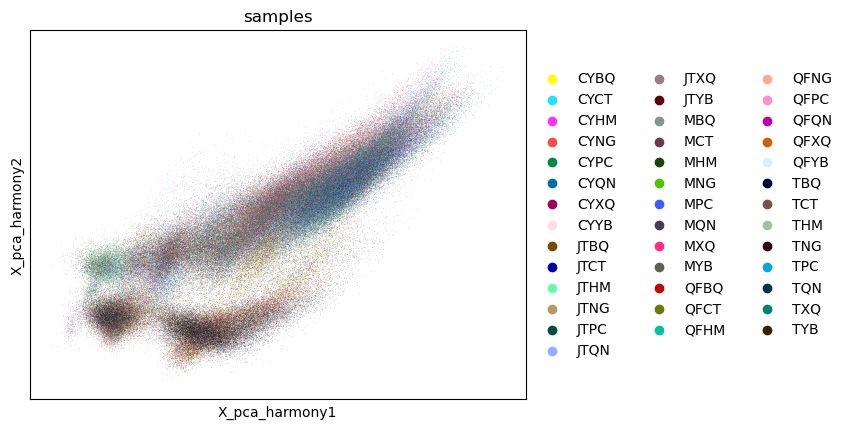

In [28]:
sc.pl.embedding(scdata, basis = 'X_pca_harmony', color = ['species', 'tissues'])
sc.pl.embedding(scdata, basis = 'X_pca_harmony', color = ['samples'])

In [30]:
scdata.obsm['harmony_0'] = scdata.obsm['X_pca_harmony'].copy()
scdata.obsm['umap_0'] = scdata.obsm['X_umap'].copy()

In [31]:
sc.pp.neighbors(scdata, use_rep = 'X_pca_harmony', n_pcs = 30)

## UMAP visualization and leiden clustering

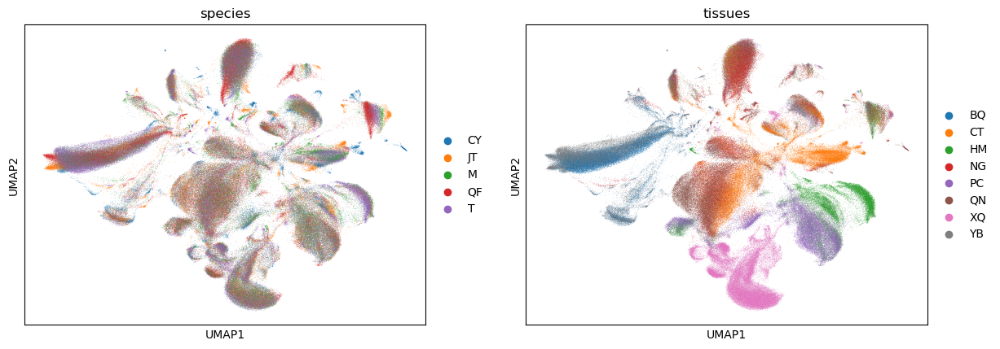

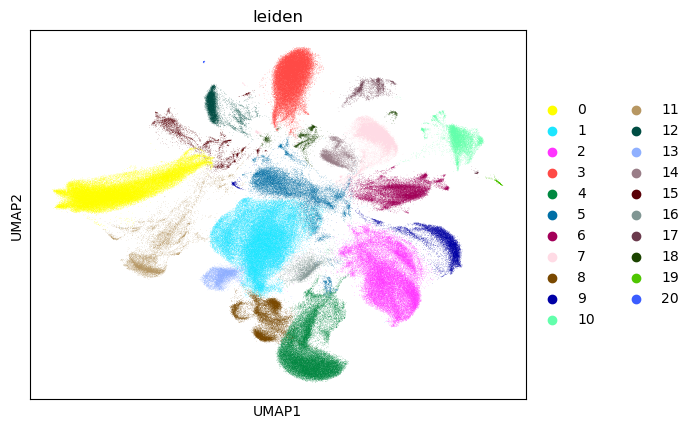

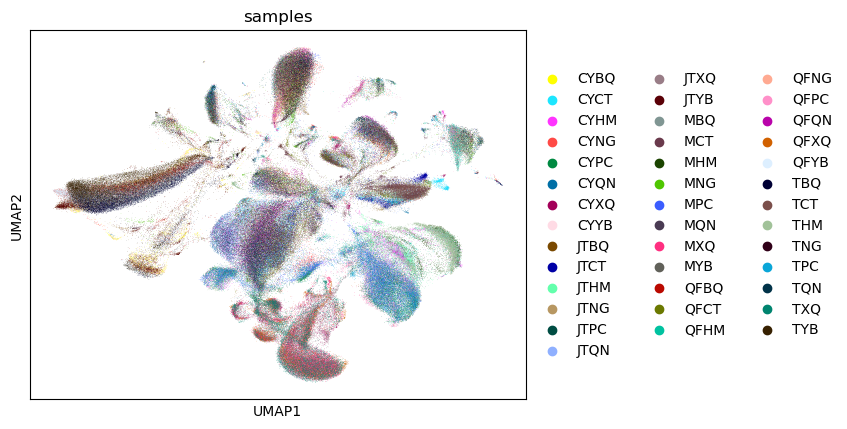

In [ ]:
sc.tl.umap(scdata)
sc.tl.leiden(scdata,resolution = 0.3)
sc.pl.umap(scdata, color = ['species','tissues'])
sc.pl.umap(scdata, color = 'leiden')
sc.pl.umap(scdata, color = 'samples')

## celltype annotation  

- First, annotate the data into  neuron, oligodendrocyte, astrocyte, OPC, microglia 5 cell types
- these five annotations are stored in the 'cluster' column 
- a more finer annotation is performed in 4_fine_anno.ipynb


{'neuron': ['Snap25', 'Map2'], 'oligodendrocyte': ['Mobp', 'Mog'], 'OPC': ['Pdgfra'], 'astrocyte': ['Slc15a2', 'Slc1a3'], 'endothelial': ['Abcc9', 'Pecam1', 'Cdh5'], 'microglia': ['Cx3cr1', 'Csf1r', 'Cd53'], 'ependymal': ['Spef2']}


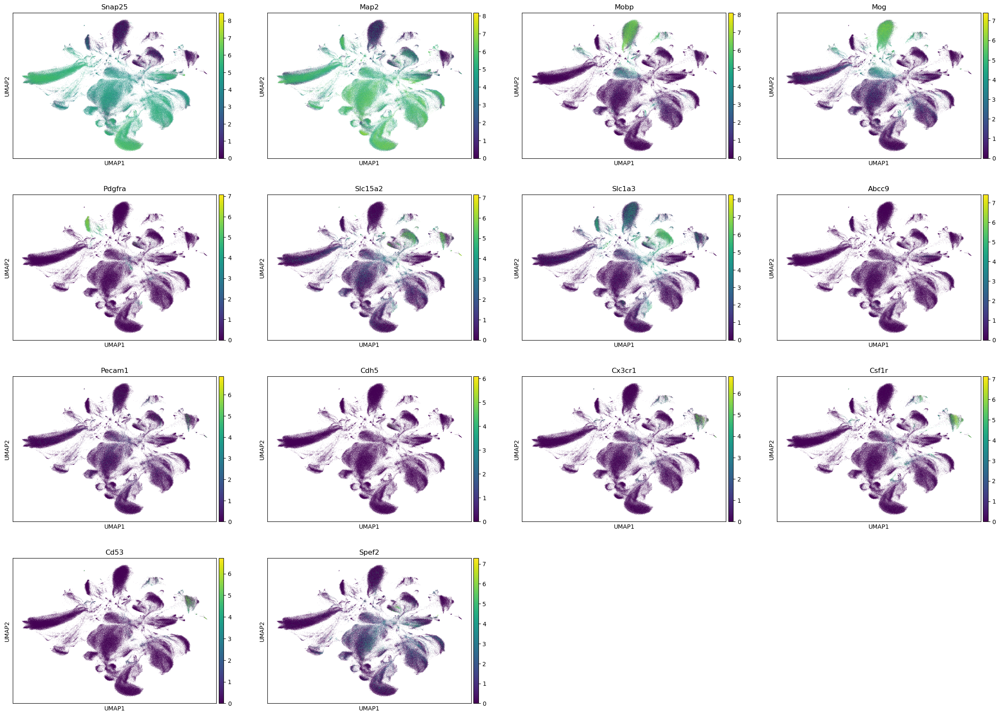

In [ ]:
raw_scdata = scdata.copy()

ori_marker_dic = {
    'neuron': ['Snap25','Map2'],
    #'excitatory neuron': ['Arpp21','Slc17a7','Vglut1', 'Vglut2','Tbr1','Neun','Foxa2'],
    #'excitatory neuron': ['Slc17a7'],
    #'inhibitory neuron': ['Gad1','Gad2'],
    'oligodendrocyte': ['Mobp','Mog','Mbp'],
    'OPC': ['Pdgfra'],
    'astrocyte': ['Aqp4', 'Gfap', 'Slc15a2','Slc1a2','Slc1a3'],
    'endothelial': ['Abcc9', 'Pecam1', 'Cdh5'],
    'microglia': ['Cx3cr1','Csf1r','Cd53'],
    'ependymal': ['Spef2']
}


marker_dic = {}
for key in ori_marker_dic:
    tmp = []
    for ele in ori_marker_dic[key]:
        if ele in scdata.raw.var.index.values:
            tmp.append(ele)
    if len(tmp) >= 1:
        marker_dic[key] = tmp
print(marker_dic)

all_marker = []
for _ in marker_dic.values():
    all_marker += _

sc.pl.umap(raw_scdata, color = all_marker)

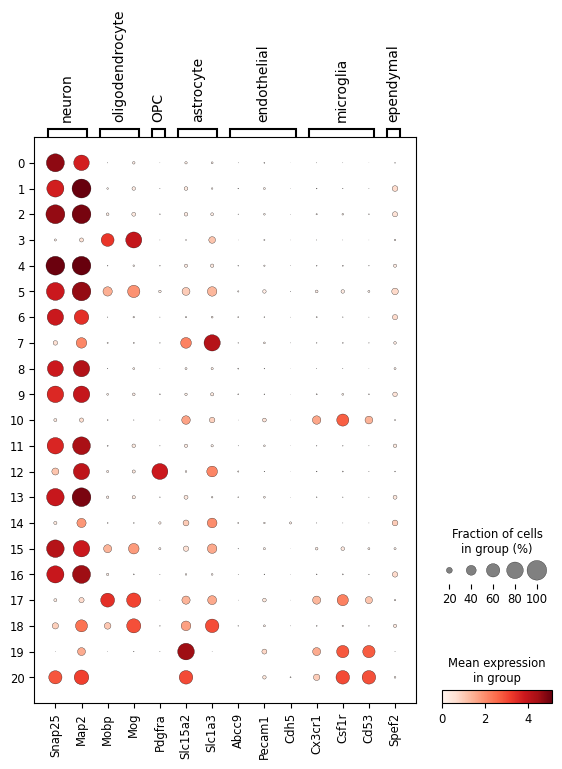

In [63]:
sc.pl.dotplot(raw_scdata, var_names = marker_dic,groupby = 'leiden', cmap = 'Reds')

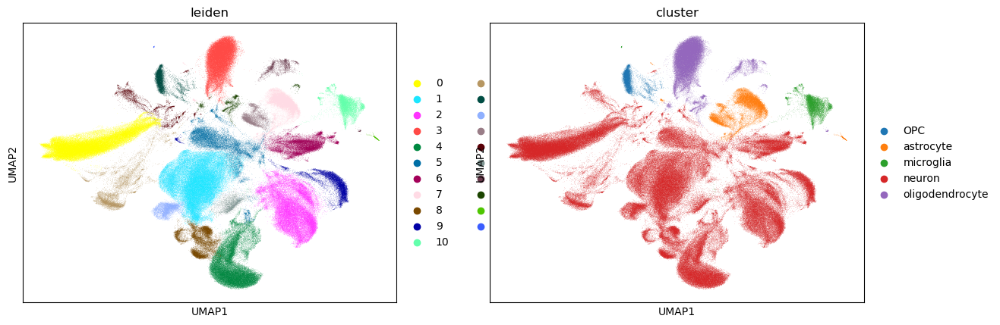

In [71]:
anno_dic = {}
for i in [0,1,2,4,5,6,8,9,11,13,15,16,20]:
    anno_dic[str(i)] = 'neuron'
for i in [3,17,18]:
    anno_dic[str(i)] = 'oligodendrocyte'
for i in [12]:
    anno_dic[str(i)] = 'OPC'
for i in [7,14,19]:
    anno_dic[str(i)] = 'astrocyte'
for i in [10,20]:
    anno_dic[str(i)] = 'microglia'
    
raw_scdata.obs.loc[:,'cluster'] = raw_scdata.obs.leiden.map(anno_dic)
sc.pl.umap(raw_scdata, color = ['leiden','cluster'])

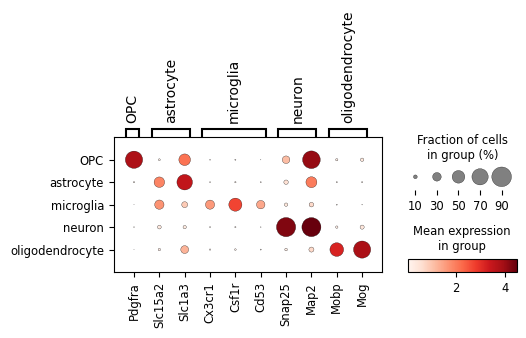

In [72]:
orderd_dic = {}
for _ in raw_scdata.obs.cluster.unique().categories.values:
    orderd_dic[_] = marker_dic[_]

sc.pl.dotplot(raw_scdata, var_names = orderd_dic,groupby = 'cluster', cmap = 'Reds')

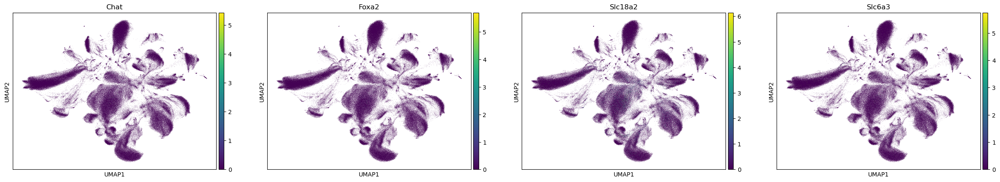

In [77]:
dopa = np.array(['Slc6a3', 'Slc18a2','Th','Foxa2','Lmx1b','Pitx3', 'Slc18a3', 'Chat'])
dopa = np.intersect1d(dopa, raw_scdata.var.index.values)
sc.pl.umap(raw_scdata, color = dopa)

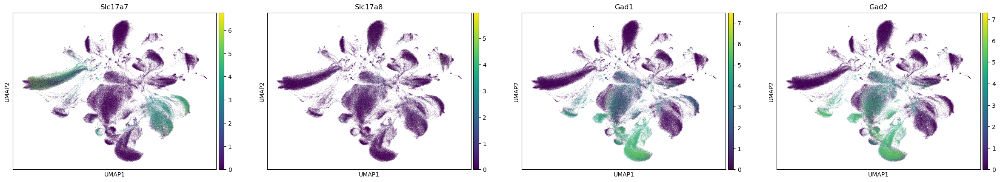

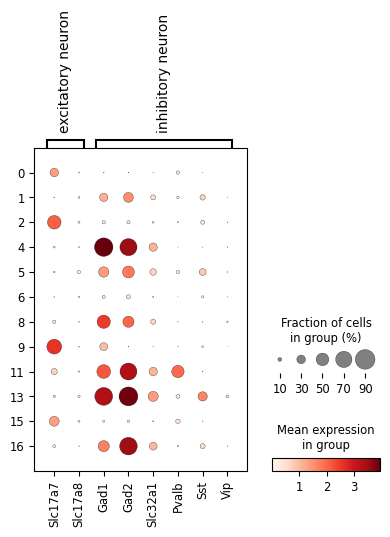

In [81]:
excitatory_markers = ['Slc17a7', 'Slc17a6', 'Slc17a8', 'Camk2a', 'Rbfox3','Vglut1', 'Vglut2']#,'Slc6a5','Slc6a9']
inhibitory_markers = ['Gad1', 'Gad2', 'Slc32a1', 'Pvalb', 'Sst', 'Vip']


neuron_dic = {'excitatory neuron': excitatory_markers,
              'inhibitory neuron': inhibitory_markers}

neu_marker_dic = {}
for key in neuron_dic:
    tmp = []
    for ele in neuron_dic[key]:
        if ele in raw_scdata.raw.var.index.values:
            tmp.append(ele)
    if len(tmp) >= 1:
        neu_marker_dic[key] = tmp
#print(marker_dic)

sc.pl.umap(raw_scdata, color = ['Slc17a7', 'Slc17a8','Gad1', 'Gad2'])
sc.pl.dotplot(raw_scdata[raw_scdata.obs.cluster == 'neuron'], var_names = neu_marker_dic,groupby = 'leiden',use_raw = True, cmap = 'Reds')


### fine annotation of neuron 

- annotate neuron into 'excitatory neuron' and 'inhibitory neuron'
- these annotations are stored in 'celltype' column

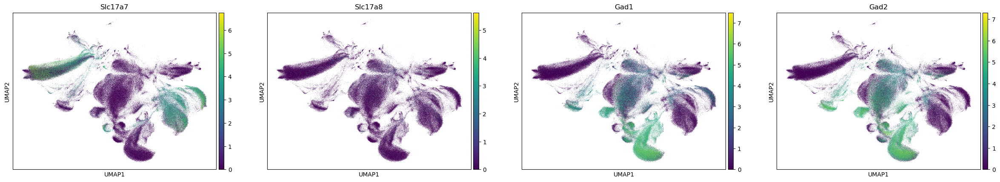

/home/sunrui/anaconda3/envs/sc_gbdt/lib/python3.9/site-packages/scanpy/plotting/_utils.py:465: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[value_to_plot + "_colors"] = colors_list


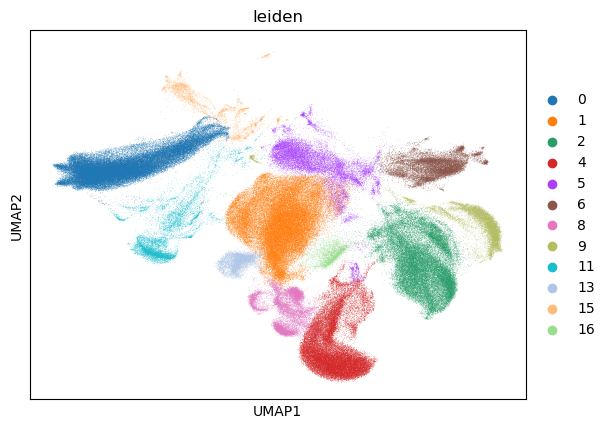

In [82]:
sc.pl.umap(raw_scdata[raw_scdata.obs.cluster == 'neuron'], color = ['Slc17a7', 'Slc17a8','Gad1', 'Gad2'])
sc.pl.umap(raw_scdata[raw_scdata.obs.cluster == 'neuron'], color = ['leiden'])

/home/sunrui/anaconda3/envs/sc_gbdt/lib/python3.9/site-packages/scanpy/tools/_rank_genes_groups.py:640: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  adata.uns[key_added] = {}


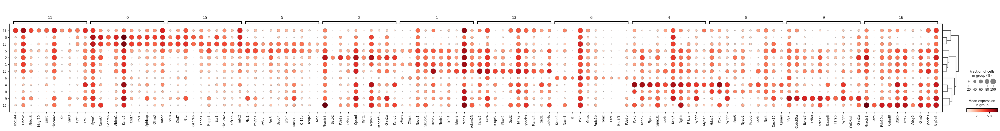

In [83]:
sub_data = raw_scdata[raw_scdata.obs.cluster == 'neuron']
sc.tl.rank_genes_groups(sub_data, groupby = 'leiden', method = 'wilcoxon')
sc.pl.rank_genes_groups_dotplot(sub_data, groupby = 'leiden')

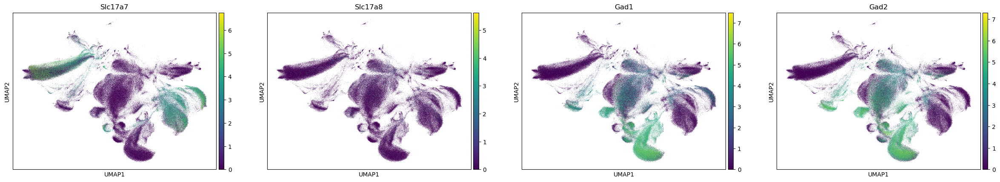

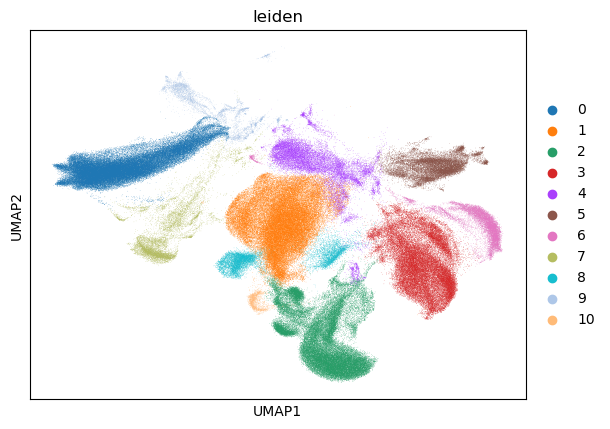

In [88]:
sc.tl.leiden(sub_data, resolution = 0.2)
sc.pl.umap(sub_data, color = ['Slc17a7', 'Slc17a8','Gad1', 'Gad2'])
sc.pl.umap(sub_data, color = ['leiden'])

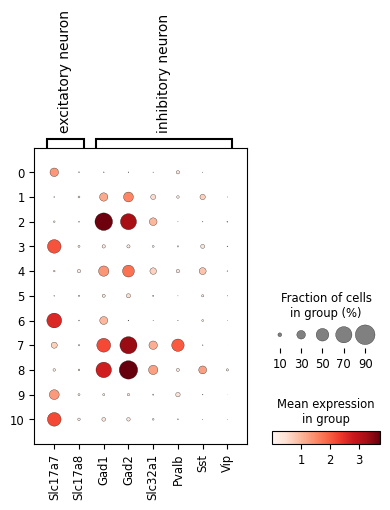

In [90]:
sc.pl.dotplot(sub_data, var_names = neu_marker_dic,groupby = 'leiden',use_raw = True, cmap = 'Reds')


/tmp/ipykernel_3136410/2114587472.py:6: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['inhibitory neuron' 'excitatory neuron' 'excitatory neuron' ...
 'excitatory neuron' 'excitatory neuron' 'excitatory neuron']' has dtype incompatible with category, please explicitly cast to a compatible dtype first.
  sub_data.obs.loc[:,'cluster'] = sub_data.obs.leiden.map(anno_dic)


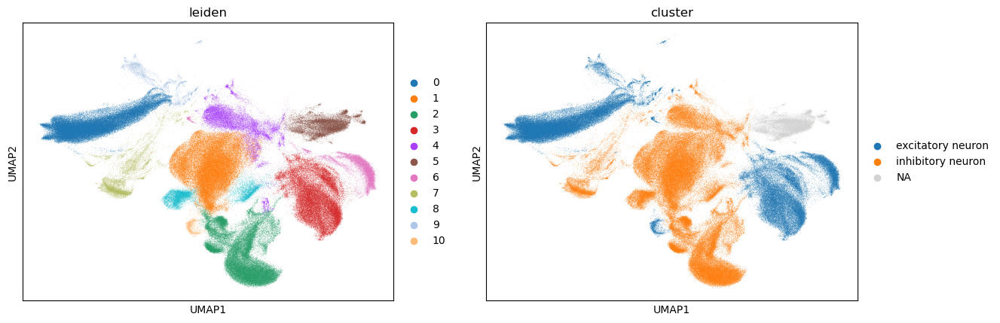

In [91]:
anno_dic = {}
for i in [0,3,6,9,10]:
    anno_dic[str(i)] = 'excitatory neuron'
for i in [1,2,4,7,8]:
    anno_dic[str(i)] = 'inhibitory neuron'
sub_data.obs.loc[:,'cluster'] = sub_data.obs.leiden.map(anno_dic)
sc.pl.umap(sub_data, color = ['leiden','cluster'])

/tmp/ipykernel_3136410/3919879007.py:5: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '['inhibitory neuron' 'excitatory neuron' 'excitatory neuron' ...
 'excitatory neuron' 'excitatory neuron' 'excitatory neuron']' has dtype incompatible with category, please explicitly cast to a compatible dtype first.
  raw_scdata.obs.loc[:,'celltype'] = celltype


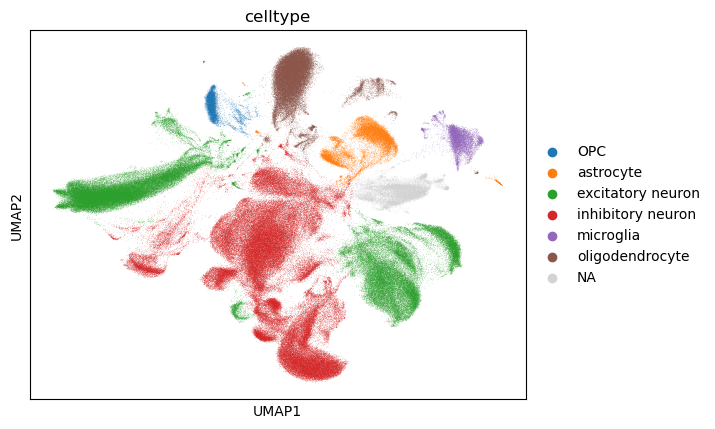

In [110]:
celltype = raw_scdata.obs.cluster
celltype = celltype.astype(object)
celltype[raw_scdata.obs.celltype == 'neuron'] = sub_data.obs.cluster.values

raw_scdata.obs.loc[:,'celltype'] = celltype
sc.pl.umap(raw_scdata, color = 'celltype')

CY


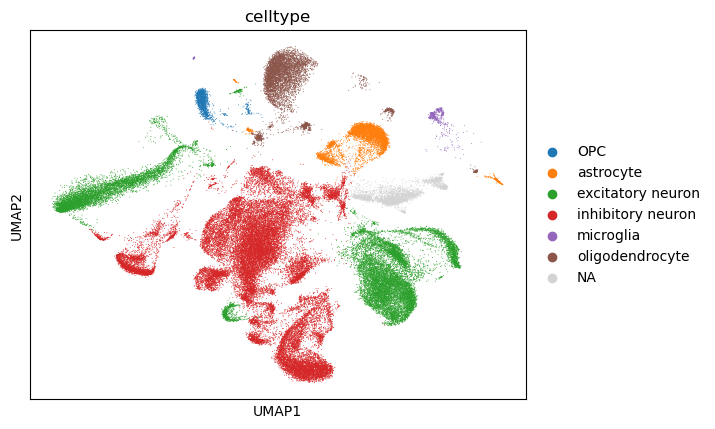

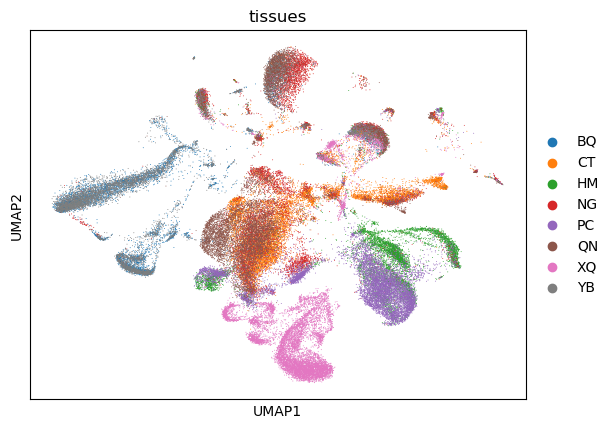

JT


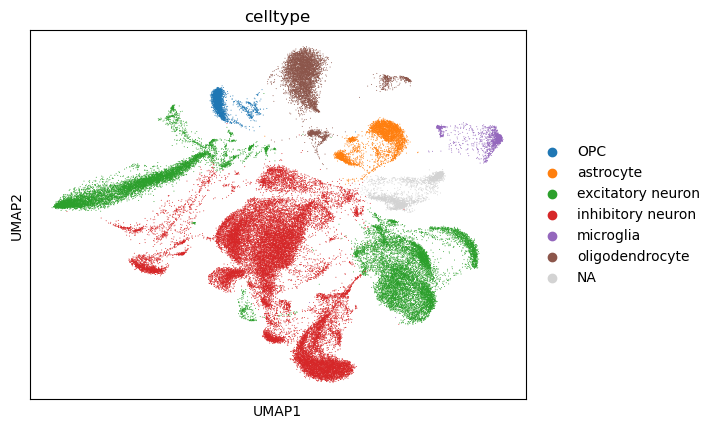

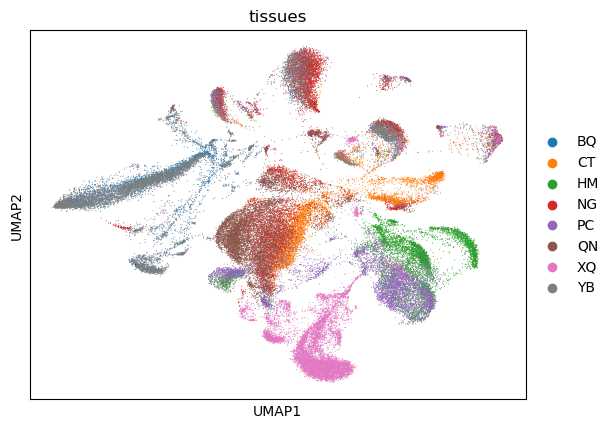

QF


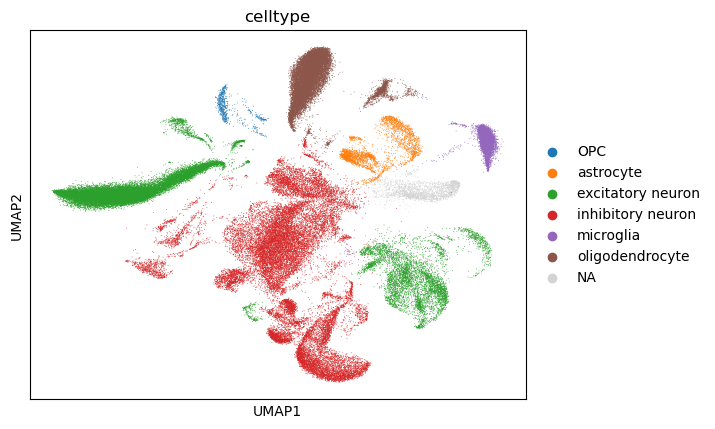

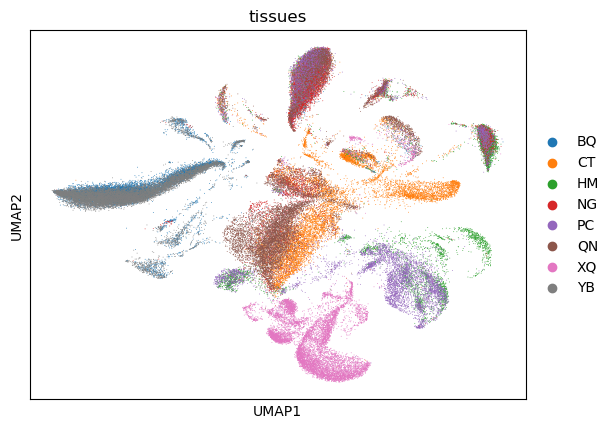

M


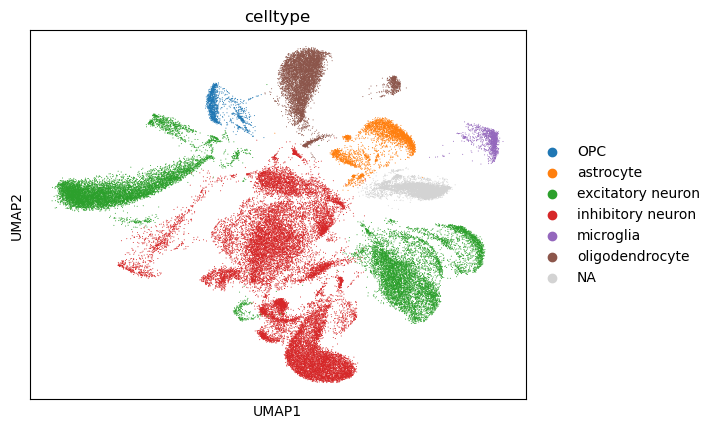

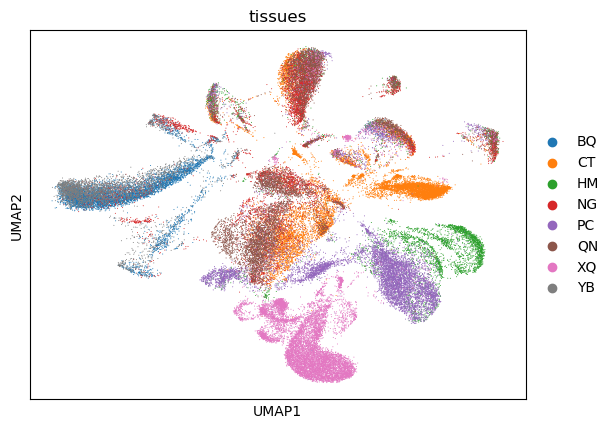

T


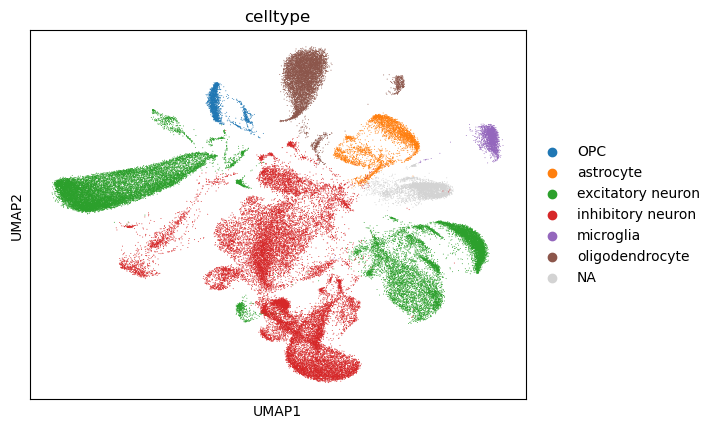

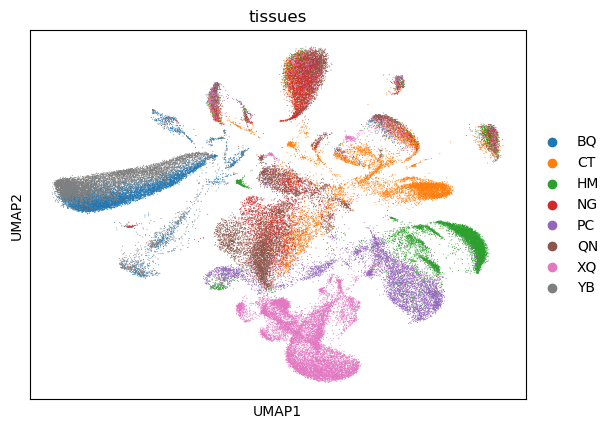

In [113]:
for _ in raw_scdata.obs.species.unique():
    print(_)
    sub_data = raw_scdata[raw_scdata.obs.species == _]
    sc.pl.umap(sub_data, color = 'celltype')
    sc.pl.umap(sub_data, color = 'tissues')

In [116]:
raw_scdata

AnnData object with n_obs × n_vars = 339043 × 3000
    obs: 'species', 'tissues', 'samples', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cluster', 'celltype'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'log1p', 'hvg', 'pca', 'neighbors', 'species_colors', 'tissues_colors', 'samples_colors', 'umap', 'leiden', 'leiden_colors', 'cluster_colors', 'celltype_colors'
    obsm: 'X_pca', 'X_umap', 'X_pca_harmony', 'harmony_0', 'umap_0'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

## save the annotation result into anno_data.h5ad

In [117]:
raw_scdata.write_h5ad('anno_data.h5ad')

In [2]:
scdata = sc.read_h5ad('../anno_data/anno_data.h5ad')
scdata

AnnData object with n_obs × n_vars = 339043 × 3000
    obs: 'species', 'tissues', 'samples', 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'cluster', 'celltype'
    var: 'gene_ids', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'celltype_colors', 'cluster_colors', 'hvg', 'leiden', 'leiden_colors', 'log1p', 'neighbors', 'pca', 'samples_colors', 'species_colors', 'tissues_colors', 'umap'
    obsm: 'X_pca', 'X_pca_harmony', 'X_umap', 'harmony_0', 'umap_0'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'